# Example of context

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

In [2]:
import numpy as np
import jax.numpy as jnp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import multihist as mh

import GOFevaluation

import appletree as apt
from appletree.utils import load_json, get_file_path

XLA_PYTHON_CLIENT_PREALLOCATE is set to false
XLA_PYTHON_CLIENT_ALLOCATOR is set to platform
Using aptext package from https://github.com/XENONnT/applefiles


In [3]:
apt.set_gpu_memory_usage(0.3)

In [4]:
pd.set_option('display.max_columns', None)

## Define context

In [5]:
# Load configuration file
config = get_file_path("idm_sr1_rn220.json")
config = load_json(config)
filename = '/home/ykaminaga/gamma_apt/fit_result/rn220_sr1_to300_fit_result_0712_50_5000.h5'
config['backend_h5'] = filename
# Initialize context
tree = apt.Context(config)

/opt/conda/envs/el7.2025.03.1/lib/python3.11/site-packages/GOFevaluation/utils.py:249: UserWarning: reference_sample contains ties, this might cause problems in the equiprobable binning.
  check_for_ties(reference_sample, dim=dim)


rn220_llh's map s2_cut_acc is using the parameter s2_cut_acc_sigma.
rn220_llh's map s1_cut_acc is using the parameter s1_cut_acc_sigma.
rn220_llh's map s1_eff_n_hits_3f is using the parameter s1_eff_n_hits_3f_sigma.


In [5]:
tree.needed_parameters

{'drift_velocity',
 'elife_sigma',
 'fano',
 'field',
 'g1',
 'g2',
 'gas_gain',
 'hits_acceptance',
 'nex_ni_ratio',
 'p_dpe',
 'py0',
 'py1',
 'py2',
 'py3',
 'py4',
 'rf0',
 'rf1',
 'rn220_ac_rate',
 'rn220_er_rate',
 's1_cut_acc_sigma',
 's1_eff_n_hits_3f_sigma',
 's2_cut_acc_sigma',
 's2_threshold',
 'w'}

In [5]:
# To see all the likelihoods

tree.print_context_summary(short=True)


LIKELIHOOD rn220_llh

----------------------------------------
BINNING

    bins_type: equiprob
    bins_on: ['cs1', 'cs2']

----------------------------------------
DATA

    file_name: /stor0/kaminaga/data/yue_rn220_global_v15_wimp_20241025.csv
    data_rate: 13285.0

----------------------------------------
MODEL

    COMPONENT 0: rn220_er
        type: simulation
        rate_par: rn220_er_rate
        pars: {'py0', 'py1', 'p_dpe', 'g1', 's2_cut_acc_sigma', 'elife_sigma', 'nex_ni_ratio', 'py4', 'fano', 's2_threshold', 'gas_gain', 'rf0', 'rf1', 'hits_acceptance', 's1_cut_acc_sigma', 'w', 'rn220_er_rate', 'py2', 'drift_velocity', 'py3', 's1_eff_n_hits_3f_sigma', 'g2', 'field'}

    COMPONENT 1: rn220_ac
        type: fixed
        file_name: ac_template_rn220_sr1.csv
        rate_par: rn220_ac_rate
        pars: {'rn220_ac_rate'}

----------------------------------------



## Fit, run the MCMC

In [6]:
result = tree.fitting(nwalkers=50, iteration=5000)

With h5 backend /home/ykaminaga/gamma_apt/fit_result/rn220_sr1_to300_fit_result_0712_50_5000.h5


  1%|▍                                                                             | 28/5000 [04:08<12:16:29,  8.89s/it]/home/ykaminaga/.local/lib/python3.11/site-packages/appletree/likelihood.py:349: RuntimeWarning: invalid value encountered in log
  llh = np.sum(self.data_hist * np.log(model_hist) - model_hist)
 27%|████████████████████                                                       | 1338/5000 [3:16:47<8:58:36,  8.82s/it]


OSError: [Errno 28] Can't close file (file write failed: time = Sun Jul 13 07:34:46 2025
, filename = '/home/ykaminaga/gamma_apt/fit_result/rn220_sr1_to300_fit_result_0712_50_5000.h5', file descriptor = 96, errno = 28, error message = 'No space left on device', buf = 0x22b7c750, total write size = 976, bytes this sub-write = 976, bytes actually written = 18446744073709551615, offset = 0)

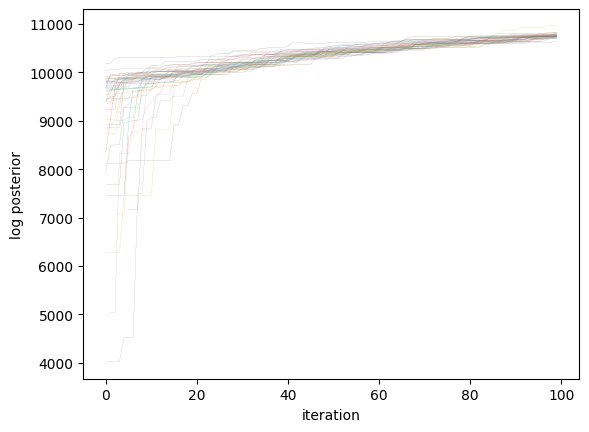

In [8]:
logp = tree.sampler.get_log_prob()

for _logp in logp.T:
    plt.plot(_logp, lw=0.1)

plt.xlabel("iteration")
plt.ylabel("log posterior")
plt.show()

logp = tree.sampler.get_log_prob()

for _logp in logp.T:
    plt.plot(_logp, lw=0.1)

plt.xlabel("iteration")
plt.ylabel("log posterior")
plt.show()

## Generate templates

In [10]:
cs1, cs2, eff = tree.get_template("rn220_llh", "rn220_er")

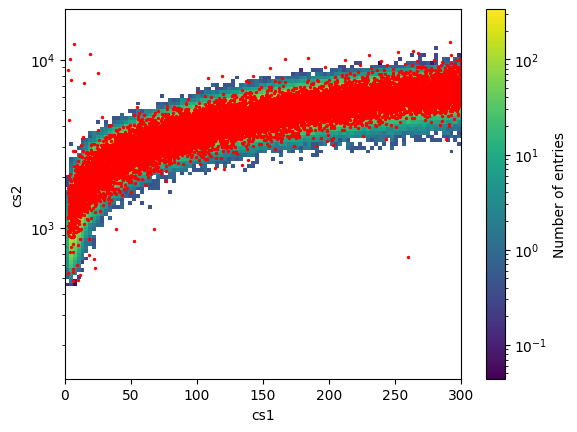

In [11]:
h, be = jnp.histogramdd(
    jnp.asarray([cs1, cs2]).T,
    bins=(jnp.linspace(0, 300, 101), jnp.logspace(2.1, 4.3, 101)),
    weights=eff,
)

h = mh.Histdd.from_histogram(np.array(h), be, axis_names=["cs1", "cs2"])
h.plot(norm=LogNorm())
plt.scatter(*tree["rn220_llh"].data.T, color="r", s=2.0)
plt.yscale("log")
plt.show()

In [12]:
parameters = tree.get_post_parameters()
key = apt.randgen.get_key()
batch_size = int(1e6)

In [13]:
par_manager = tree.par_manager
par_manager.par_config

{'w': {'prior_type': 'norm',
  'prior_args': {'mean': 0.0137, 'std': 0.0002},
  'allowed_range': [0, 1.0],
  'init_mean': 0.013749650633572542,
  'init_std': 0.0002,
  'unit': 'keV',
  'doc': 'Mean energy to generate a quanta in liquid xenon'},
 'fano': {'prior_type': 'fixed',
  'prior_args': {'val': 0.059},
  'allowed_range': None,
  'init_mean': None,
  'init_std': None,
  'unit': '1',
  'doc': 'Fano factor which describes the fluctuation of num of quanta'},
 'gas_gain': {'prior_type': 'fixed',
  'prior_args': {'val': 29.4},
  'allowed_range': None,
  'init_mean': None,
  'init_std': None,
  'unit': 'PE/electron',
  'doc': 'Gas gain'},
 'drift_velocity': {'prior_type': 'fixed',
  'prior_args': {'val': 0.0677},
  'allowed_range': None,
  'init_mean': None,
  'init_std': None,
  'unit': 'cm/us',
  'doc': 'Drift velocity'},
 's2_threshold': {'prior_type': 'fixed',
  'prior_args': {'val': 100.0},
  'allowed_range': None,
  'init_mean': None,
  'init_std': None,
  'unit': 'PE',
  'doc': '

In [14]:
parameters # Rn220

{'w': np.float64(0.010671577310967052),
 'fano': 0.059,
 'gas_gain': 29.4,
 'drift_velocity': 0.0677,
 's2_threshold': 100.0,
 'field': 23.0,
 'nex_ni_ratio': np.float64(0.15989941813658357),
 'g1': np.float64(0.13533728421546257),
 'g2': np.float64(13.195624558321446),
 'p_dpe': np.float64(0.1530560868615875),
 'elife_sigma': np.float64(-0.2650971351426933),
 's1_eff_n_hits_3f_sigma': np.float64(4.816507511552796),
 's1_cut_acc_sigma': np.float64(4.908649846275085),
 's2_cut_acc_sigma': np.float64(-4.901015005827336),
 'hits_acceptance': np.float64(0.9796330027919326),
 'py0': np.float64(0.15106408083502548),
 'py1': np.float64(65.2889681772071),
 'py2': np.float64(-0.5067872005813521),
 'py3': np.float64(-1.3321394844618777),
 'py4': np.float64(0.14657076918067147),
 'rf0': np.float64(0.025407814547817306),
 'rf1': np.float64(0.7399816733522101),
 'rn220_er_rate': np.float64(7117.550223022842),
 'rn220_ac_rate': np.float64(120.3805849992327)}

In [12]:
parameters

{'w': np.float64(0.014440128368420043),
 'fano': 0.059,
 'gas_gain': 29.4,
 'drift_velocity': 0.0677,
 's2_threshold': 100.0,
 'field': 23.0,
 'nex_ni_ratio': np.float64(0.139441884646009),
 'g1': np.float64(0.1349423183606932),
 'g2': np.float64(15.937577332813094),
 'p_dpe': np.float64(0.18437504031270266),
 'elife_sigma': np.float64(-0.08672553915376661),
 's1_eff_n_hits_3f_sigma': np.float64(-2.2050808082923115),
 's1_cut_acc_sigma_rn220': np.float64(1.5995665882104526),
 's1_cut_acc_sigma_ar37': np.float64(0.0681060990475233),
 's2_cut_acc_sigma_rn220': np.float64(1.033399976988104),
 's2_cut_acc_sigma_ar37': np.float64(2.5799139948165943),
 'hits_acceptance': np.float64(0.9083056873584544),
 'py0': np.float64(0.2955033850614798),
 'py1': np.float64(57.51449925036204),
 'py2': np.float64(-0.5980118228864278),
 'py3': np.float64(1.9853854863089968),
 'py4': np.float64(0.3371209149859471),
 'rf0': np.float64(0.029841477152759092),
 'rf1': np.float64(0.04154369084472988),
 'rn220_er_

In [21]:
with open('/home/ykaminaga/appletree/appletree/parameters/list_er_rn220_ar37.json', 'w') as f:
    json.dump(parameters, f, indent=2)

In [15]:
key, (cs1, cs2, eff) = tree["rn220_llh"]["rn220_er"].simulate(key, batch_size, parameters)

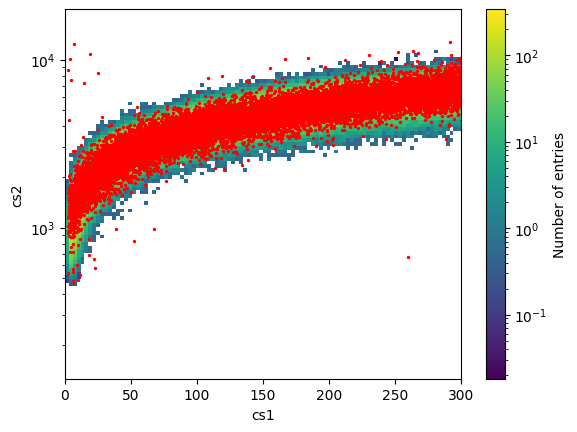

In [16]:
h, be = jnp.histogramdd(
    jnp.asarray([cs1, cs2]).T,
    bins=(jnp.linspace(0, 300, 101), jnp.logspace(2.1, 4.3, 101)),
    weights=eff,
)

h = mh.Histdd.from_histogram(np.array(h), be, axis_names=["cs1", "cs2"])
h.plot(norm=LogNorm())
plt.scatter(*tree["rn220_llh"].data.T, color="r", s=2.0)
plt.yscale("log")
plt.show()

In [17]:
from appletree.utils import load_json, get_file_path
from GOFevaluation import BinnedPoissonChi2GOF, ADTestTwoSampleGOF

In [19]:
data_sample = tree["rn220_llh"].data
mask = data_sample[:, 0] <= 300
mask &= data_sample[:, 0] >= 0
mask &= data_sample[:, 1] <= 1.5e4
mask &= data_sample[:, 1] >= 1e2
data_sample = data_sample[mask]

In [20]:
mask = cs1 <= 300
mask &= cs1 >= 0
mask &= cs2 <= 1.5e4
mask &= cs2 >= 1e2
mask &= np.random.rand(len(cs1)) < eff
eff = eff[mask]

In [25]:
reference_sample=np.vstack([cs1[mask], cs2[mask]]).T

# Add AC
ac_template = get_file_path('ac_template_rn220_sr1.csv')
ac_sample = pd.read_csv(ac_template)
ac_sample = ac_sample[(ac_sample.cs1>0)&(ac_sample.cs1<300)&(ac_sample.cs2>1e2)&(ac_sample.cs2<1.5e4)]
ac_rate = int(parameters['rn220_ac_rate'] / parameters['rn220_er_rate'] * len(reference_sample))
index = np.random.choice(len(ac_sample), size=ac_rate)
ac_sample = ac_sample[['cs1', 'cs2']].to_numpy()[index]

reference_sample = np.concatenate([reference_sample, ac_sample])
reference_sample_weights = np.concatenate([eff, np.ones(len(ac_sample))])

In [29]:
reference_sample_weights

array([0.53004497, 0.4595283 , 0.4551895 , ..., 1.        , 1.        ,
       1.        ])

/tmp/ipykernel_488977/2289049927.py:4: UserWarning: Number of reference samples (209210) should be much larger than number of data samples (13285) to ensure negligible statistical fluctuations for the equiprobable binning.
  gof = BinnedPoissonChi2GOF.bin_equiprobable(
/opt/conda/envs/el7.2025.03.1/lib/python3.11/site-packages/GOFevaluation/utils.py:249: UserWarning: reference_sample contains ties, this might cause problems in the equiprobable binning.
  check_for_ties(reference_sample, dim=dim)
/tmp/ipykernel_488977/2289049927.py:4: UserWarning: Could not achieve exact equiprobable binning, the approximately equiprobable binning is used which has a minimum expectation value of 147.509  and a maximum expectation value of 147.726.
  gof = BinnedPoissonChi2GOF.bin_equiprobable(
/opt/conda/envs/el7.2025.03.1/lib/python3.11/site-packages/GOFevaluation/evaluator_base.py:141: UserWarning: The expected counts in the bins are not equal, ranging from 147.50948957837892 to 147.72584695714818.
  

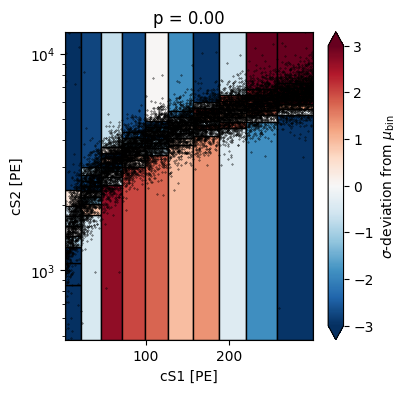

In [26]:
x_clip = tree["rn220_llh"]._config["x_clip"]
y_clip = tree["rn220_llh"]._config["y_clip"]

gof = BinnedPoissonChi2GOF.bin_equiprobable(
    data_sample,
    reference_sample=reference_sample,
    nevents_expected=len(data_sample),
    n_partitions=[10, 9],
    plot=True,
    reference_sample_weights=reference_sample_weights,
    vmin=-3,
    vmax=+3,
)
plt.scatter(data_sample[:, 0],
            data_sample[:, 1],
            s=0.1, color='k')

plt.title(f"p = {gof.get_pvalue(n_mc=10000):.2f}")
plt.yscale('log')
plt.xlabel('cS1 [PE]')
plt.ylabel('cS2 [PE]')
plt.show()

In [51]:
df = ac_sample

rn220_cutlist = {'cut_s1_pattern_top_paired', 'cut_s2_pattern_paired', 'cut_s1_tightcoin_3fold_paired', 
                 'cut_s1_area_fraction_top_paired', 'cut_s2_single_scatter_paired', 'cut_s1_pattern_bottom_paired', 
                 'cut_interaction_exists_paired', 'cut_s1_single_scatter_paired', 'cut_cs2_area_fraction_top_paired', 
                 'cut_s2_width_wire_modeled_low_er_paired', 'cut_fiducial_volume_cylinder_paired', 'cut_rn220_s2_area_paired', 
                 'cut_s1_max_pmt_paired', 'cut_ambience_paired', 'cut_s1_width_paired', 'cut_shadow_paired'}

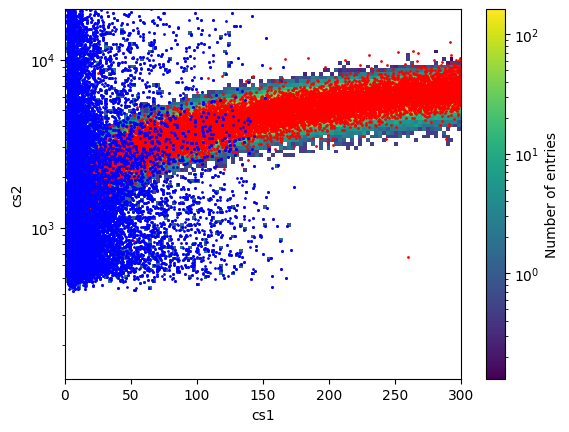

In [60]:
h, be = jnp.histogramdd(
    reference_sample,
    bins=(jnp.linspace(0, 300, 101), jnp.logspace(2.1, 4.3, 101)),
    weights=reference_sample_weights,
)
h = mh.Histdd.from_histogram(np.array(h), be, axis_names=["cs1", "cs2"])
h.plot(norm=LogNorm())
plt.scatter(*tree["rn220_llh"].data.T, color="r", s=1)
plt.scatter(ac_sample.cs1, ac_sample.cs2, color="b", s=1)
plt.yscale("log")
plt.show()

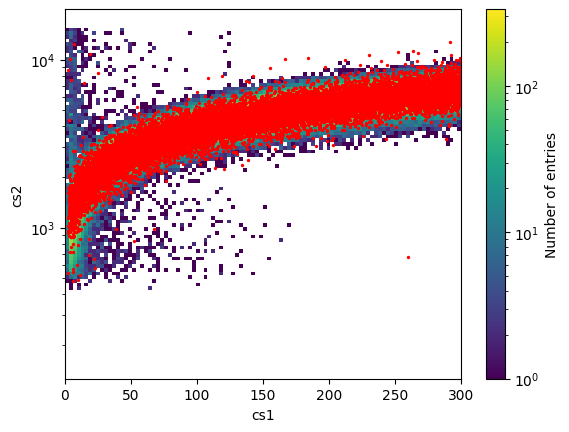

In [28]:
h, be = jnp.histogramdd(
    reference_sample,
    bins=(jnp.linspace(0, 300, 101), jnp.logspace(2.1, 4.3, 101)),
)
h = mh.Histdd.from_histogram(np.array(h), be, axis_names=["cs1", "cs2"])
h.plot(norm=LogNorm())
plt.scatter(*tree["rn220_llh"].data.T, color="r", s=2.0)
plt.yscale("log")
plt.show()

## Number of events in equal-probability binning

In [13]:
key, h = tree["rn220_llh"]["rn220_er"].simulate_hist(key, batch_size, parameters)

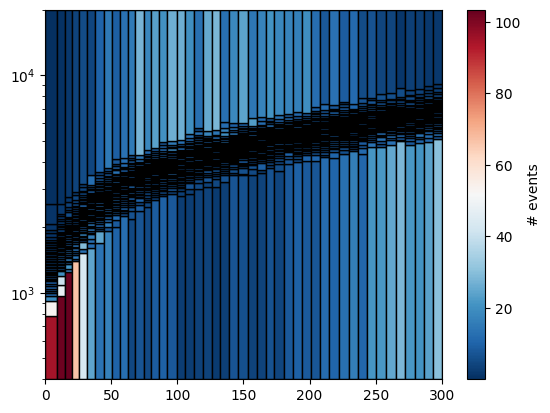

In [14]:
apt.utils.plot_irreg_histogram_2d(*tree["rn220_llh"]["rn220_er"].bins, h, density=False)
plt.yscale("log")
plt.show()

In [19]:
import h5py
import json
from appletree import Plotter
fig = Plotter(filename)#, thin=2)

In [24]:
flat_samples = tree.sampler.get_chain(discard=100, thin=2, flat=True)
print(flat_samples.shape)

(497500, 18)


In [25]:
with h5py.File(os.path.join(os.getcwd(), tree.sampler.backend.filename), 'r', libver='latest', swmr=True) as opt:
    name = 'mcmc'
    par_config = json.loads(opt[name].attrs['par_config'])
    post_parameters = json.loads(opt[name].attrs['post_parameters'])

In [23]:
import corner
def make_plot(sampler,burnin=700):
    samples = sampler.get_chain(discard=burnin, flat=True)
    log_prob_samples = sampler.get_log_prob(discard=burnin, flat=True)
    log_prior_samples = sampler.get_blobs(discard=burnin, flat=True)
    
    all_samples = np.concatenate(
        (samples, log_prob_samples[:, None]), axis=1 #, log_prior_samples[:, None]), axis=1
    )
    return samples, all_samples

In [34]:
samples, all_samples = make_plot(tree.sampler, burnin=tree.sampler.backend.iteration-1000)

In [51]:
labels=np.array(list(parameters.keys()))

In [53]:
labels+['NLL']

array(['wNLL', 'fanoNLL', 'gas_gainNLL', 'drift_velocityNLL',
       's2_thresholdNLL', 'fieldNLL', 'nex_ni_ratioNLL', 'g1NLL', 'g2NLL',
       'p_dpeNLL', 'elife_sigmaNLL', 's1_eff_3f_sigmaNLL',
       's1_cut_acc_sigmaNLL', 's2_cut_acc_sigmaNLL', 'py0NLL', 'py1NLL',
       'py2NLL', 'py3NLL', 'py4NLL', 'rf0NLL', 'rf1NLL',
       'xe131m_er_rateNLL', 'xe131m_ac_rateNLL'], dtype='<U19')

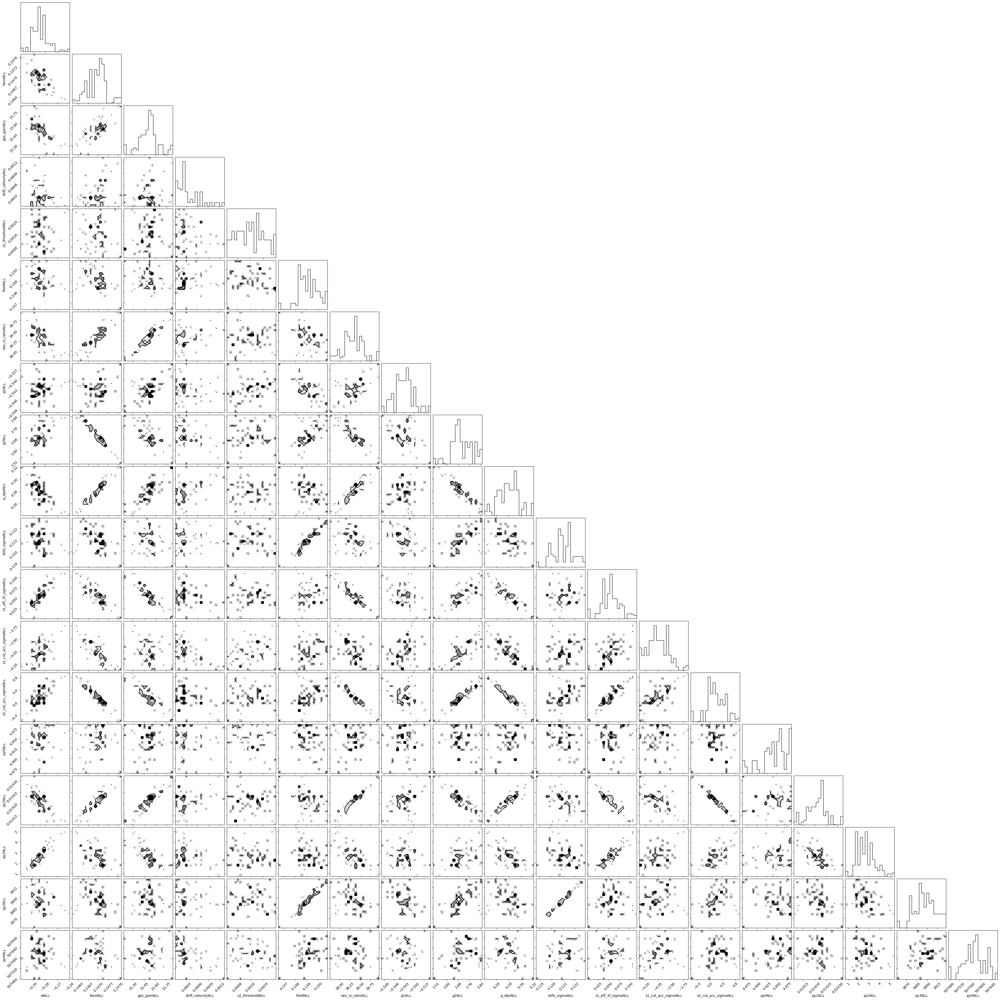

In [52]:
corner.corner(all_samples,labels=labels+['NLL'])
plt.show()

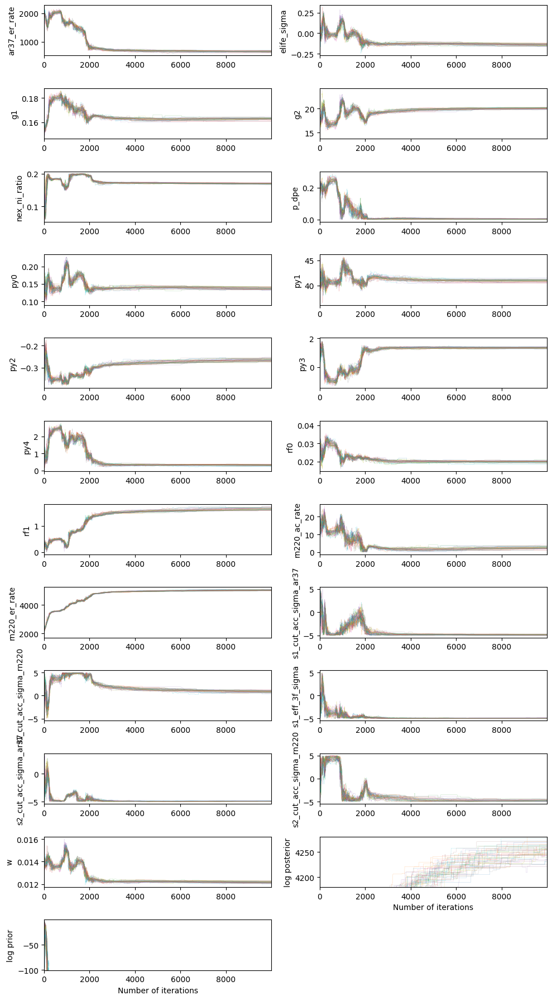

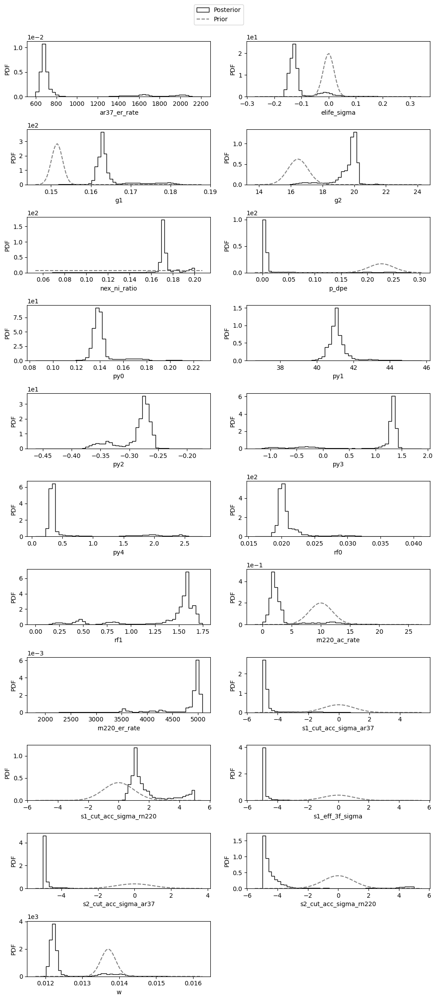

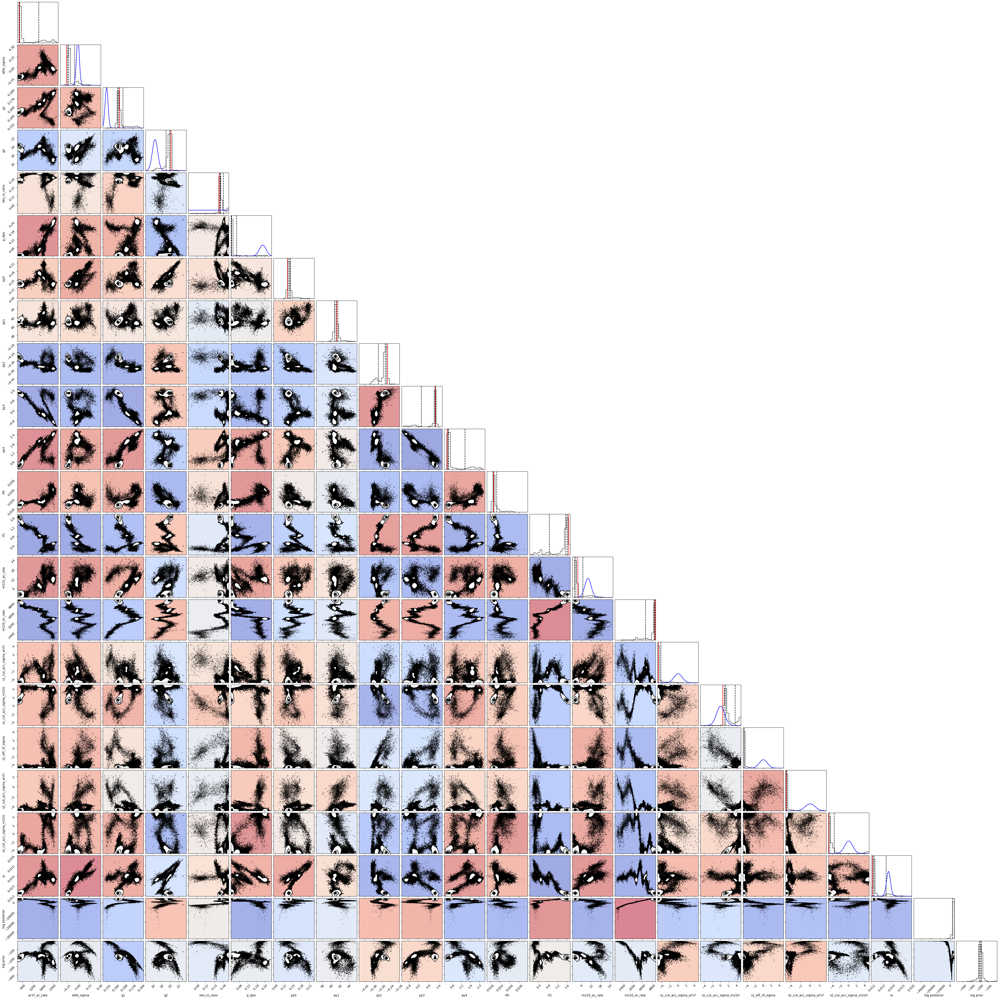

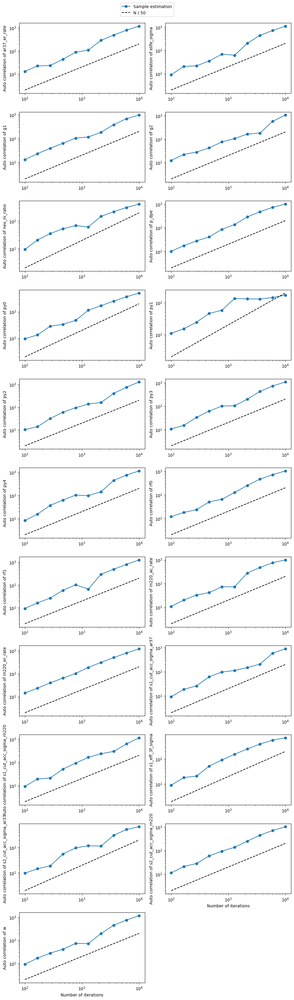

In [20]:
fig.make_all_plots()
plt.show();
#plt.savefig("fig/All_plots_xe131m_sr1_constantr_fit_result_0702_50_20000.SVG");